_This notebook contains code and comments from Section 7.2 of the book [Ensemble Methods for Machine Learning](https://www.manning.com/books/ensemble-methods-for-machine-learning). Please see the book for additional details on this topic. This notebook and code are released under the [MIT license](https://github.com/gkunapuli/ensemble-methods-notebooks/blob/master/LICENSE)._

---

## Estudio de caso: Pronóstico de la demanda
La previsión de la demanda es un problema importante que surge en muchos contextos empresariales, donde el objetivo es predecir la demanda de un determinado producto o producto básico. Predecir con precisión la demanda es fundamental para la gestión y optimización de la cadena de suministro aguas abajo: para garantizar que haya suficiente suministro para satisfacer las necesidades y no demasiado como para que se desperdicie.

En esta sección, estudiamos el problema de la previsión de alquiler de bicicletas. Como vemos a continuación, la naturaleza del problema (y especialmente, los objetivos/etiquetas) es bastante similar a los que surgen en las áreas de análisis y predicción del tiempo, análisis de seguros y riesgos, informática de la salud, pronóstico de la demanda de energía, inteligencia comercial y muchos otros.

El conjunto de datos de Bike Rental fue el primero de varios conjuntos de datos similares disponibles públicamente que rastrean el uso de los servicios de bicicletas compartidas en las principales áreas metropolitanas. Estos conjuntos de datos se ponen a disposición del público a través del repositorio de aprendizaje automático de UCI.

Este conjunto de datos, disponible por primera vez en 2013, rastrea los alquileres de bicicletas por hora y por día de Capital Bike Sharing en Washington DC. Además, el conjunto de datos también contiene varias características que describen el clima, así como la hora y el día del año.
El objetivo general del problema es predecir la demanda de alquiler de bicicletas según la hora del día, la temporada y el clima. La demanda se mide en número total de usuarios. El número total de usuarios se compone además de usuarios ocasionales y registrados.

El número de usuarios registrados parece ser bastante constante a lo largo del año, ya que estos son usuarios que presumiblemente usan bicicletas compartidas como una opción de transporte regular en lugar de una actividad recreativa. Esto es similar a los viajeros que tienen un pase de autobús mensual/anual para sus viajes diarios en comparación con, digamos, los turistas, que solo compran boletos de autobús cuando los necesitan.
Teniendo esto en cuenta, construimos un conjunto de datos derivados para nuestro estudio de caso que se puede usar para construir un modelo para pronosticar la demanda de bicicletas de alquiler de usuarios ocasionales.

**Problema**: Prediga la cantidad de usuarios ocasionales de alquiler de bicicletas según la hora del día, la estación y el clima.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
# # Load the original UCI data set, drop some columns and save it for this Case Study
# data = pd.read_csv('./data/ch07/bikesharing-hour.csv')
# data = data.drop(['dteday', 'instant', 'yr', 'registered', 'cnt'], axis=1)
# data.to_csv('./data/ch07/bikesharing.csv', index=False)

### Preprocesamiento
Preprocesemos este conjunto de datos mediante la normalización de las características, es decir, nos aseguramos de que cada característica tenga una desviación estándar unitaria media cero. La normalización no siempre es el mejor enfoque para tratar con características discretas. Sin embargo, por ahora, usemos este preprocesamiento simple y concentrémonos en los conjuntos para la regresión.

La siguiente lista muestra nuestros pasos de preprocesamiento: divide los datos en entrenamiento (80 % de los datos) y conjuntos de prueba (20 % restante de los datos) y aplica la normalización a las funciones. Como siempre, sacaremos el conjunto de prueba del proceso de entrenamiento para poder evaluar el rendimiento de cada uno de nuestros modelos entrenados en el conjunto de prueba.

In [2]:
data = pd.read_csv('./data/ch07/bikesharing.csv')
pd.options.display.float_format = '{:,.3f}'.format
data.describe()

,season,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual
count,"17,379.000","17,379.000","17,379.000","17,379.000","17,379.000","17,379.000","17,379.000","17,379.000","17,379.000","17,379.000","17,379.000","17,379.000"
mean,2.502,6.538,11.547,0.029,3.004,0.683,1.425,0.497,0.476,0.627,0.190,35.676
std,1.107,3.439,6.914,0.167,2.006,0.465,0.639,0.193,0.172,0.193,0.122,49.305
min,1.000,1.000,0.000,0.000,0.000,0.000,1.000,0.020,0.000,0.000,0.000,0.000
25%,2.000,4.000,6.000,0.000,1.000,0.000,1.000,0.340,0.333,0.480,0.104,4.000
50%,3.000,7.000,12.000,0.000,3.000,1.000,1.000,0.500,0.485,0.630,0.194,17.000
75%,3.000,10.000,18.000,0.000,5.000,1.000,2.000,0.660,0.621,0.780,0.254,48.000
max,4.000,12.000,23.000,1.000,6.000,1.000,4.000,1.000,1.000,1.000,0.851,367.000


**Apartado 7.8**: Preprocesamiento del conjunto de datos de alquiler de bicicletas

In [3]:
# Get indices for the features and labels
labels = data.columns.get_loc('casual')
features = np.setdiff1d(np.arange(0, len(data.columns), 1), labels)

# Split into train and test sets
from sklearn.model_selection import train_test_split
trn, tst = train_test_split(data, test_size=0.2, random_state=42)
Xtrn, ytrn = trn.values[:, features], trn.values[:, labels]
Xtst, ytst = tst.values[:, features], tst.values[:, labels]

# Normalize the data
from sklearn.preprocessing import StandardScaler
preprocessor = StandardScaler().fit(Xtrn)
Xtrn, Xtst = preprocessor.transform(Xtrn), preprocessor.transform(Xtst)

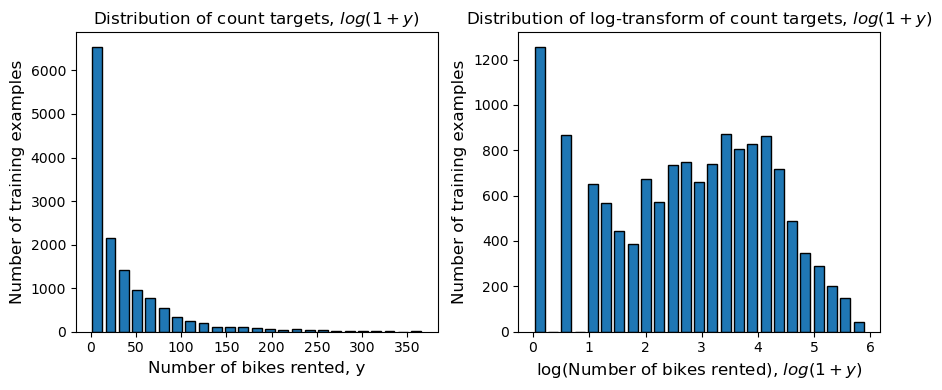

In [4]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(9, 4))

counts, bins = np.histogram(ytrn, bins=25)
ax[0].hist(bins[:-1], bins, weights=counts, rwidth=0.75, edgecolor='k')
ax[0].set_title('Distribution of count targets, $log(1 + y)$', fontsize=12)
ax[0].set_xlabel('Number of bikes rented, y', fontsize=12)
ax[0].set_ylabel('Number of training examples', fontsize=12)

counts, bins = np.histogram(np.log(1 + ytrn), bins=25)
ax[1].hist(bins[:-1], bins, weights=counts, rwidth=0.75, edgecolor='k')
ax[1].set_title('Distribution of log-transform of count targets, $log(1 + y)$', fontsize=12)
ax[1].set_xlabel('log(Number of bikes rented), $log(1 + y)$', fontsize=12)
ax[1].set_ylabel('Number of training examples', fontsize=12)

fig.tight_layout()
# plt.savefig('./figures/CH07_F13_Kunapuli.png', format='png', dpi=300, bbox_inches='tight')
# plt.savefig('./figures/CH07_F13_Kunapuli.pdf', format='pdf', dpi=300, bbox_inches='tight')

---
### Modelos lineales generalizados y apilamiento

**Apartado 7.9**: Entrenamiento de ``GLMs`` para predicción de alquiler de bicicletas

In [5]:
# NOTA MUY IMPORTANTE

# podemos eliminar los warnings (o la mayoria) usando
import warnings
warnings.filterwarnings('ignore')

In [6]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.linear_model import Ridge, PoissonRegressor, TweedieRegressor

parameters = {'GLM: Linear': {'alpha': 10 ** np.arange(-4., 1.)},
              'GLM: Poisson': {'alpha': 10 ** np.arange(-4., 1.)},
              'GLM: Tweedie': {'alpha': 10 ** np.arange(-4., 1.), 
                               'power': np.linspace(1.1, 1.9, num=5)}}

glms = {'GLM: Linear': Ridge(),
        'GLM: Poisson': PoissonRegressor(max_iter=1000), 
        'GLM: Tweedie': TweedieRegressor(max_iter=1000)}

best_glms = {}
results = pd.DataFrame()

for glm_type, glm in glms.items():
    param_tuner = GridSearchCV(glm, parameters[glm_type], cv=5, refit=True, verbose=2)
    param_tuner.fit(Xtrn, ytrn)
    
    best_glms[glm_type] = param_tuner.best_estimator_
    ypred_trn = best_glms[glm_type].predict(Xtrn)
    ypred_tst = best_glms[glm_type].predict(Xtst)
    
    res = {'Method': glm_type, 
            'Train MSE': mean_squared_error(ytrn, ypred_trn),
            'Train MAE': mean_absolute_error(ytrn, ypred_trn), 
            'Train R2': r2_score(ytrn, ypred_trn), 
            'Test MSE': mean_squared_error(ytst, ypred_tst),
            'Test MAE': mean_absolute_error(ytst, ypred_tst),
            'Test R2': r2_score(ytst, ypred_tst)}
    
    results = pd.concat([results, pd.DataFrame([res])], ignore_index=True)

Fitting 5 folds for each of 5 candidates, totalling 25 fits
[CV] END .......................................alpha=0.0001; total time=   0.0s
[CV] END .......................................alpha=0.0001; total time=   0.0s
[CV] END .......................................alpha=0.0001; total time=   0.0s
[CV] END .......................................alpha=0.0001; total time=   0.0s
[CV] END .......................................alpha=0.0001; total time=   0.0s
[CV] END ........................................alpha=0.001; total time=   0.0s
[CV] END ........................................alpha=0.001; total time=   0.0s
[CV] END ........................................alpha=0.001; total time=   0.0s
[CV] END ........................................alpha=0.001; total time=   0.0s
[CV] END ........................................alpha=0.001; total time=   0.0s
[CV] END .........................................alpha=0.01; total time=   0.0s
[CV] END ........................................

In [7]:
results

,Method,Train MSE,Train MAE,Train R2,Test MSE,Test MAE,Test R2
0,GLM: Linear,"1,368.677",24.964,0.444,"1,270.174",23.985,0.447
1,GLM: Poisson,"1,354.006",21.726,0.450,"1,228.898",20.641,0.465
2,GLM: Tweedie,"1,383.374",21.755,0.438,"1,254.304",20.661,0.454


**Apartado 7.10**: Apilamiento de GLM para la predicción de alquiler de bicicletas

In [8]:
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import StackingRegressor

base_estimators = list(best_glms.items())
meta_learner = MLPRegressor(hidden_layer_sizes=(25, 25, 25), max_iter=1000, activation='relu')
stack = StackingRegressor(base_estimators, final_estimator=meta_learner)
stack.fit(Xtrn, ytrn)

ypred_trn = stack.predict(Xtrn)
ypred_tst = stack.predict(Xtst)
    
res = {'Method': 'GLM Stack', 
        'Train MSE': mean_squared_error(ytrn, ypred_trn),
        'Train MAE': mean_absolute_error(ytrn, ypred_trn), 
        'Train R2': r2_score(ytrn, ypred_trn), 
        'Test MSE': mean_squared_error(ytst, ypred_tst),
        'Test MAE': mean_absolute_error(ytst, ypred_tst),
        'Test R2': r2_score(ytst, ypred_tst)}

results = pd.concat([results, pd.DataFrame([res])], ignore_index=True)

In [9]:
results

,Method,Train MSE,Train MAE,Train R2,Test MSE,Test MAE,Test R2
0,GLM: Linear,"1,368.677",24.964,0.444,"1,270.174",23.985,0.447
1,GLM: Poisson,"1,354.006",21.726,0.450,"1,228.898",20.641,0.465
2,GLM: Tweedie,"1,383.374",21.755,0.438,"1,254.304",20.661,0.454
3,GLM Stack,989.046,18.912,0.599,939.336,18.082,0.591


---
### Bosque aleatorio y árboles adicionales

**Apartado 7.11**: Random Forest y ExtraTrees para predicción de alquiler de bicicletas

In [10]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import ExtraTreesRegressor

parameters = {'n_estimators': np.arange(200, 600, step=100), 
              'max_depth': np.arange(4, 7, step=1)}

print(parameters)
ensembles = {'RF: Squared Error': RandomForestRegressor(criterion='squared_error'),
             'RF: Poisson': RandomForestRegressor(criterion='poisson'),
             'XT: Squared Error': ExtraTreesRegressor(criterion='squared_error'), 
             'XT: Poisson': ExtraTreesRegressor(criterion='poisson')}
             
for ens_type, ensemble in ensembles.items():
    param_tuner = GridSearchCV(ensemble, parameters, cv=5, refit=True, verbose=2)
    param_tuner.fit(Xtrn, ytrn)
        
    ypred_trn = param_tuner.best_estimator_.predict(Xtrn)
    ypred_tst = param_tuner.best_estimator_.predict(Xtst)
    
    res = {'Method': ens_type, 
            'Train MSE': mean_squared_error(ytrn, ypred_trn),
            'Train MAE': mean_absolute_error(ytrn, ypred_trn), 
            'Train R2': r2_score(ytrn, ypred_trn), 
            'Test MSE': mean_squared_error(ytst, ypred_tst),
            'Test MAE': mean_absolute_error(ytst, ypred_tst),
            'Test R2': r2_score(ytst, ypred_tst)}
    
    results = pd.concat([results, pd.DataFrame([res])], ignore_index=True)

{'n_estimators': array([200, 300, 400, 500]), 'max_depth': array([4, 5, 6])}
Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV] END ......................max_depth=4, n_estimators=200; total time=   1.5s
[CV] END ......................max_depth=4, n_estimators=200; total time=   1.5s
[CV] END ......................max_depth=4, n_estimators=200; total time=   1.5s
[CV] END ......................max_depth=4, n_estimators=200; total time=   1.4s
[CV] END ......................max_depth=4, n_estimators=200; total time=   1.5s
[CV] END ......................max_depth=4, n_estimators=300; total time=   2.2s
[CV] END ......................max_depth=4, n_estimators=300; total time=   2.2s
[CV] END ......................max_depth=4, n_estimators=300; total time=   2.2s
[CV] END ......................max_depth=4, n_estimators=300; total time=   2.2s
[CV] END ......................max_depth=4, n_estimators=300; total time=   2.2s
[CV] END ......................max_depth=4, n_estima

In [11]:
results

,Method,Train MSE,Train MAE,Train R2,Test MSE,Test MAE,Test R2
0,GLM: Linear,"1,368.677",24.964,0.444,"1,270.174",23.985,0.447
1,GLM: Poisson,"1,354.006",21.726,0.450,"1,228.898",20.641,0.465
2,GLM: Tweedie,"1,383.374",21.755,0.438,"1,254.304",20.661,0.454
3,GLM Stack,989.046,18.912,0.599,939.336,18.082,0.591
4,RF: Squared Error,495.029,12.517,0.799,486.299,12.266,0.788
5,RF: Poisson,563.196,13.069,0.771,546.201,12.677,0.762
6,XT: Squared Error,565.469,13.882,0.770,556.951,13.662,0.758
7,XT: Poisson,576.596,13.913,0.766,568.926,13.752,0.752


### Modelos de aumento de gradiente

**Nota**: Cuando se ejecuta, la selección de parámetros a continuación produce ocasionalmente ``Advertencia de error de ajuste`` para algunas combinaciones de parámetros. Este es un error conocido en la implementación de xgboost de la métrica de evaluación ``poisson-nloglik``, y puede ignorarse por ahora.

**Apartado 7.12**: XGBoost para predicción de alquiler de bicicletas

In [12]:
from xgboost import XGBRegressor
from sklearn.model_selection import RandomizedSearchCV

parameters = {'max_depth': np.arange(2, 7, step=1), 
              'learning_rate': 2**np.arange(-8., 2., step=2),
              'colsample_bytree': [0.4, 0.5, 0.6, 0.7, 0.8],
              'reg_alpha': [0, 0.01, 0.1, 1, 10],
              'reg_lambda': [0, 0.01, 0.1, 1e-1, 1, 10]}
print(parameters)

ensembles = {'XGB: Squared Error': XGBRegressor(objective='reg:squarederror', eval_metric='poisson-nloglik'),
             'XGB: Pseudo Huber': XGBRegressor(objective='reg:pseudohubererror', eval_metric='poisson-nloglik'),
             'XGB: Poisson': XGBRegressor(objective='count:poisson', eval_metric='poisson-nloglik'),
             'XGB: Tweedie': XGBRegressor(objective='reg:tweedie', eval_metric='poisson-nloglik')}

for ens_type, ensemble in ensembles.items():
    if ens_type == 'XGB: Tweedie':
        parameters['tweedie_variance_power'] = np.linspace(1.1, 1.9, num=9)
    
    param_tuner = RandomizedSearchCV(ensemble, parameters, n_iter=50, cv=5, refit=True, verbose=2)
    param_tuner.fit(Xtrn, ytrn, eval_set=[(Xtst, ytst)], verbose=False)
        
    ypred_trn = param_tuner.best_estimator_.predict(Xtrn)
    ypred_tst = param_tuner.best_estimator_.predict(Xtst)
    
    res = {'Method': ens_type, 
            'Train MSE': mean_squared_error(ytrn, ypred_trn),
            'Train MAE': mean_absolute_error(ytrn, ypred_trn), 
            'Train R2': r2_score(ytrn, ypred_trn), 
            'Test MSE': mean_squared_error(ytst, ypred_tst),
            'Test MAE': mean_absolute_error(ytst, ypred_tst),
            'Test R2': r2_score(ytst, ypred_tst)}
    
    results = pd.concat([results, pd.DataFrame([res])], ignore_index=True)

{'max_depth': array([2, 3, 4, 5, 6]), 'learning_rate': array([0.00390625, 0.015625  , 0.0625    , 0.25      , 1.        ]), 'colsample_bytree': [0.4, 0.5, 0.6, 0.7, 0.8], 'reg_alpha': [0, 0.01, 0.1, 1, 10], 'reg_lambda': [0, 0.01, 0.1, 0.1, 1, 10]}
Fitting 5 folds for each of 50 candidates, totalling 250 fits
[CV] END colsample_bytree=0.8, learning_rate=0.00390625, max_depth=5, reg_alpha=0, reg_lambda=0.1; total time=   0.1s
[CV] END colsample_bytree=0.8, learning_rate=0.00390625, max_depth=5, reg_alpha=0, reg_lambda=0.1; total time=   0.1s
[CV] END colsample_bytree=0.8, learning_rate=0.00390625, max_depth=5, reg_alpha=0, reg_lambda=0.1; total time=   0.1s
[CV] END colsample_bytree=0.8, learning_rate=0.00390625, max_depth=5, reg_alpha=0, reg_lambda=0.1; total time=   0.1s
[CV] END colsample_bytree=0.8, learning_rate=0.00390625, max_depth=5, reg_alpha=0, reg_lambda=0.1; total time=   0.1s
[CV] END colsample_bytree=0.6, learning_rate=0.25, max_depth=3, reg_alpha=1, reg_lambda=0; total ti

In [13]:
np.sum(ytst == 0), ytst.shape

(324, (3476,))

In [14]:
results

,Method,Train MSE,Train MAE,Train R2,Test MSE,Test MAE,Test R2
0,GLM: Linear,"1,368.677",24.964,0.444,"1,270.174",23.985,0.447
1,GLM: Poisson,"1,354.006",21.726,0.450,"1,228.898",20.641,0.465
2,GLM: Tweedie,"1,383.374",21.755,0.438,"1,254.304",20.661,0.454
3,GLM Stack,989.046,18.912,0.599,939.336,18.082,0.591
4,RF: Squared Error,495.029,12.517,0.799,486.299,12.266,0.788
5,RF: Poisson,563.196,13.069,0.771,546.201,12.677,0.762
6,XT: Squared Error,565.469,13.882,0.770,556.951,13.662,0.758
7,XT: Poisson,576.596,13.913,0.766,568.926,13.752,0.752
8,XGB: Squared Error,164.609,7.969,0.933,264.860,9.715,0.885
9,XGB: Pseudo Huber,396.661,10.619,0.839,402.101,10.723,0.825


In [15]:
from lightgbm import LGBMRegressor

parameters = {'max_depth': np.arange(2, 7, step=1), 
              'learning_rate': 2**np.arange(-8., 2., step=2),
              'bagging_fraction': [0.4, 0.5, 0.6, 0.7, 0.8],
              'lambda_l1': [0, 0.01, 0.1, 1, 10],
              'lambda_l2': [0, 0.01, 0.1, 1e-1, 1, 10]}
print(parameters)

ensembles = {'LGBM: Squared Error': LGBMRegressor(objective='mse'),
             'LGBM: Absolute Error': LGBMRegressor(objective='mae'),
             'LGBM: Huber': LGBMRegressor(objective='huber'),             
             'LGBM: Quantile': LGBMRegressor(objective='quantile'),
             'LGBM: Poisson': LGBMRegressor(objective='poisson'), 
             'LGBM: Tweedie': LGBMRegressor(objective='tweedie'), }

for ens_type, ensemble in ensembles.items():
    if ens_type == 'LGBM: Tweedie':
        parameters['tweedie_variance_power'] = np.linspace(1.1, 1.9, num=9)
    
    param_tuner = RandomizedSearchCV(ensemble, parameters, n_iter=50, cv=5, refit=True, verbose=2)
    param_tuner.fit(Xtrn, ytrn, eval_set=[(Xtst, ytst)], eval_metric='poisson')
        
    ypred_trn = param_tuner.best_estimator_.predict(Xtrn)
    ypred_tst = param_tuner.best_estimator_.predict(Xtst)
    
    res = {'Method': ens_type, 
            'Train MSE': mean_squared_error(ytrn, ypred_trn),
            'Train MAE': mean_absolute_error(ytrn, ypred_trn), 
            'Train R2': r2_score(ytrn, ypred_trn), 
            'Test MSE': mean_squared_error(ytst, ypred_tst),
            'Test MAE': mean_absolute_error(ytst, ypred_tst),
            'Test R2': r2_score(ytst, ypred_tst)}
    
    results = pd.concat([results, pd.DataFrame([res])], ignore_index=True)

{'max_depth': array([2, 3, 4, 5, 6]), 'learning_rate': array([0.00390625, 0.015625  , 0.0625    , 0.25      , 1.        ]), 'bagging_fraction': [0.4, 0.5, 0.6, 0.7, 0.8], 'lambda_l1': [0, 0.01, 0.1, 1, 10], 'lambda_l2': [0, 0.01, 0.1, 0.1, 1, 10]}
Fitting 5 folds for each of 50 candidates, totalling 250 fits
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[1]	valid_0's poisson: -87.894	valid_0's l2: 2247.68
[2]	valid_0's poisson: -88.5711	valid_0's l2: 2196.68
[3]	valid_0's poisson: -89.2094	valid_0's l2: 2147.27
[4]	valid_0's poisson: -89.8182	valid_0's l2: 2098.95
[5]	valid_0's poisson: -90.3943	valid_0's l2: 2052.14
[6]	valid_0's poisson: -90.9387	valid_0's l2: 2007.05
[7]	valid_0's poisson: -91.4583	valid_0's l2: 1963.

---
#### Visualización de todos los resultados juntos como un gráfico de barras

In [16]:
results

,Method,Train MSE,Train MAE,Train R2,Test MSE,Test MAE,Test R2
0,GLM: Linear,"1,368.677",24.964,0.444,"1,270.174",23.985,0.447
1,GLM: Poisson,"1,354.006",21.726,0.450,"1,228.898",20.641,0.465
2,GLM: Tweedie,"1,383.374",21.755,0.438,"1,254.304",20.661,0.454
3,GLM Stack,989.046,18.912,0.599,939.336,18.082,0.591
4,RF: Squared Error,495.029,12.517,0.799,486.299,12.266,0.788
5,RF: Poisson,563.196,13.069,0.771,546.201,12.677,0.762
6,XT: Squared Error,565.469,13.882,0.770,556.951,13.662,0.758
7,XT: Poisson,576.596,13.913,0.766,568.926,13.752,0.752
8,XGB: Squared Error,164.609,7.969,0.933,264.860,9.715,0.885
9,XGB: Pseudo Huber,396.661,10.619,0.839,402.101,10.723,0.825


In [17]:
# Save all the results so that we can plot without running the whole lot of experiments again
results.to_csv('./data/ch07/case-study-results.csv', index=False)

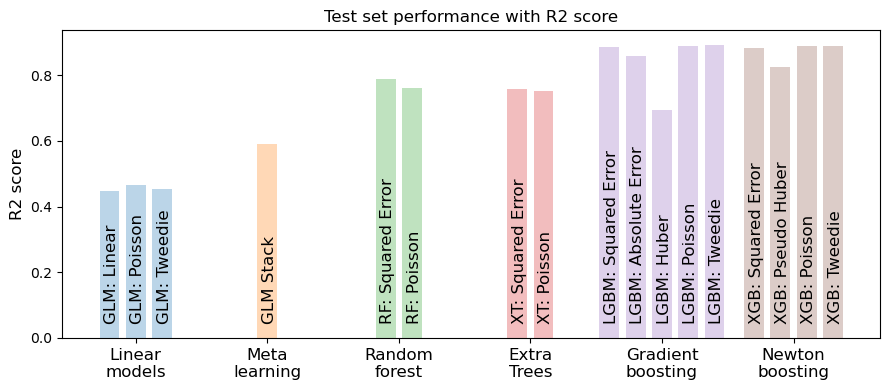

In [18]:
results = pd.read_csv('./data/ch07/case-study-results.csv')
groups = {'Linear\nmodels': ['GLM: Linear', 'GLM: Poisson', 'GLM: Tweedie'],
          'Meta\nlearning': ['GLM Stack'],
          'Random\nforest': ['RF: Squared Error', 'RF: Poisson'],
          'Extra\nTrees': ['XT: Squared Error', 'XT: Poisson'],
          'Gradient\nboosting': ['LGBM: Squared Error', 'LGBM: Absolute Error', 
                                 'LGBM: Huber', 'LGBM: Poisson', 'LGBM: Tweedie'],
          'Newton\nboosting': ['XGB: Squared Error', 'XGB: Pseudo Huber', 'XGB: Poisson', 'XGB: Tweedie']}
          
# fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(12, 4))   
# for j, metric in enumerate(['Test MAE', 'Test MSE', 'Test R2']):
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(9, 4))   
for j, metric in enumerate(['Test R2']):
    for i, (methods, group) in enumerate(groups.items()):
        yy = results[results.Method.isin(group)][metric].values
        xx = i + (np.arange(0, len(yy)) - np.median(np.arange(0, len(yy)))) * 0.2
        ax.bar(xx, yy, width=0.15, alpha=0.3)
        for k in range(len(group)):
            ax.text(xx[k]-0.04, 0.05, group[k], rotation='vertical', fontsize=12)           
ax.set_xticks(range(6))
ax.set_xticklabels(list(groups.keys()), fontsize=12)
ax.set_ylabel('R2 score', fontsize=12)
ax.set_title('Test set performance with R2 score', fontsize=12)

fig.tight_layout()
# plt.savefig('./figures/CH07_F14_Kunapuli.png', format='png', dpi=300, bbox_inches='tight')
# plt.savefig('./figures/CH07_F14_Kunapuli.pdf', format='pdf', dpi=300, bbox_inches='tight')

In [19]:
import pandas as pd
df = pd.read_csv('./data/ch07/case-study-results.csv')
print(df.to_string(index=False))

              Method  Train MSE  Train MAE  Train R2  Test MSE  Test MAE  Test R2
         GLM: Linear  1,368.677     24.964     0.444 1,270.174    23.985    0.447
        GLM: Poisson  1,354.006     21.726     0.450 1,228.898    20.641    0.465
        GLM: Tweedie  1,383.374     21.755     0.438 1,254.304    20.661    0.454
           GLM Stack    989.046     18.912     0.599   939.336    18.082    0.591
   RF: Squared Error    495.029     12.517     0.799   486.299    12.266    0.788
         RF: Poisson    563.196     13.069     0.771   546.201    12.677    0.762
   XT: Squared Error    565.469     13.882     0.770   556.951    13.662    0.758
         XT: Poisson    576.596     13.913     0.766   568.926    13.752    0.752
  XGB: Squared Error    164.609      7.969     0.933   264.860     9.715    0.885
   XGB: Pseudo Huber    396.661     10.619     0.839   402.101    10.723    0.825
        XGB: Poisson    193.975      8.168     0.921   251.699     9.031    0.890
        XGB: Twe